<a href="https://colab.research.google.com/github/reshalfahsi/image-super-resolution/blob/master/ImageSuperResolution.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Image Super-Resolution**

## **Important Libraries**

In [ ]:
!pip install -q --no-cache-dir lightning torchmetrics kornia

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 13.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.1/731.1 kB 27.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 705.7/705.7 kB 30.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.4/66.4 kB 163.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.7/70.7 kB 169.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.7/65.7 kB 162.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 596.7/596.7 kB 36.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.7/45.7 kB 175.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.8/69.8 kB 259.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.5/59.5 kB 157.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.9/129.9 kB 173.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 722.8/722.8 kB 36.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
import lightning as L
from lightning.pytorch import Trainer, seed_everything
from lightning.pytorch.loggers import TensorBoardLogger, CSVLogger
from lightning.pytorch.callbacks.early_stopping import EarlyStopping
from lightning.pytorch.callbacks import LearningRateMonitor, ModelCheckpoint

from torchmetrics.image import (
    PeakSignalNoiseRatio,
    StructuralSimilarityIndexMeasure
)
from torchmetrics.regression import MeanAbsoluteError

from google.colab.patches import cv2_imshow

import torch
import torch.nn as nn
import torch.optim as optim
import torch.utils.data as data
import torch.nn.functional as F
from torch.autograd import Variable

from torchvision.models import vgg19

import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageOps
import PIL

from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset

from kornia.filters import laplacian

import os
import cv2
import random
import math
from glob import glob

import time

import warnings

warnings.filterwarnings("ignore")

%matplotlib inline
plt.rcParams['axes.facecolor'] = 'lightgray'
plt.rcParams['mathtext.fontset'] = 'cm'
plt.rcParams['font.family'] = 'STIXGeneral'

## **Configuration**

In [ ]:
MAX_EPOCH = 420
BATCH_SIZE = 7
LR = 9.6e-3
CHECKPOINT_DIR = os.getcwd()
IMAGE_SIZE = 256
SCALE_FACTOR = 4
N_FILTER = 32
RESIDUAL_BLOCK = 12

## **Dataset**

### **Download**

In [ ]:
!git clone https://github.com/BIDS/BSDS500

Cloning into 'BSDS500'...
remote: Enumerating objects: 2380, done.
remote: Total 2380 (delta 0), reused 0 (delta 0), pack-reused 2380
Receiving objects: 100% (2380/2380), 155.21 MiB | 16.90 MiB/s, done.
Resolving deltas: 100% (139/139), done.
Updating files: 100% (2268/2268), done.


### **Utils**

In [ ]:
def low_res_transform(img):
    img = cv2.resize(
        img,
        (IMAGE_SIZE // SCALE_FACTOR, IMAGE_SIZE // SCALE_FACTOR),
        interpolation = cv2.INTER_AREA,
    )

    img = img.transpose(2,0,1).astype('float32')

    img /= 255.
    return torch.from_numpy(img)


def high_res_transform(img):
    img = cv2.resize(
        img,
        (IMAGE_SIZE, IMAGE_SIZE),
        interpolation = cv2.INTER_AREA,
    )

    img = img.transpose(2,0,1).astype('float32')

    img /= 255.
    return torch.from_numpy(img)

In [ ]:
class BSDS500Dataset(data.Dataset):
    def __init__(
        self,
        split=None,
        low_res_transform=None,
        high_res_transform=None,
        root="./BSDS500/BSDS500",
    ):
        super().__init__()

        assert split is not None, (
            "Please specify dataset split: train, val, test, and inference"
        )

        if split == "train":
            self._dataset = sorted(glob(f"{root}/data/images/train/*.jpg"))
        elif split == "val":
            self._dataset = sorted(glob(f"{root}/data/images/val/*.jpg"))
        elif split in ["test", "inference"]:
            self._dataset = sorted(glob(f"{root}/data/images/test/*.jpg"))
        else:
            raise TypeError(f"Unrecognized split type: {split}")

        self._split = split
        self._low_res_transform = low_res_transform
        self._high_res_transform = high_res_transform

    def set_inference_index(self, idx):
        self._inference_index = idx

    @property
    def inference_image(self):
        return cv2.imread(self._dataset[self._inference_index])

    def __len__(self):
        return 1 if self._split == "inference" else len(self._dataset)

    def __getitem__(self, idx):
        if self._split == "inference":
            low_res = self.inference_image
        else:
            low_res = cv2.imread(self._dataset[idx])
            high_res = cv2.imread(self._dataset[idx])
        if self._low_res_transform is not None:
            low_res = self._low_res_transform(low_res)
            if self._split != "inference":
                high_res = self._high_res_transform(high_res)
        if self._split == "inference": return low_res
        return low_res, high_res

In [ ]:
TrainDataset = BSDS500Dataset(
    split="train",
    low_res_transform=low_res_transform,
    high_res_transform=high_res_transform,
)
TestDataset = BSDS500Dataset(
    split="test",
    low_res_transform=low_res_transform,
    high_res_transform=high_res_transform,
)
ValDataset = BSDS500Dataset(
    split="val",
    low_res_transform=low_res_transform,
    high_res_transform=high_res_transform,
)

## **Model**

### **Utils**

In [ ]:
class AvgMeter(object):
    def __init__(self, num=40):
        self.num = num
        self.reset()

    def reset(self):
        self.losses = []

    def update(self, val):
        self.losses.append(val)

    def show(self):
        out = torch.mean(
            torch.stack(
                self.losses[np.maximum(len(self.losses)-self.num, 0):]
            )
        )
        return out

### **ESRGAN**

In [ ]:
class ContentExtractor(nn.Module):
    def __init__(self):
        super(ContentExtractor, self).__init__()
        vgg19_model = vgg19(pretrained=True)
        self.vgg19_54 = nn.Sequential(*list(vgg19_model.features.children())[:35])

    def forward(self, img):
        return self.vgg19_54(img)

In [ ]:
class DenseResidualBlock(nn.Module):
    """
    The core module of paper: (Residual Dense Network for Image Super-Resolution, CVPR 18)
    """

    def __init__(self, filters, res_scale=0.2):
        super(DenseResidualBlock, self).__init__()
        self.res_scale = res_scale

        def block(in_features, non_linearity=True):
            layers = [nn.Conv2d(in_features, filters, 3, 1, 1, bias=True)]
            if non_linearity:
                layers += [nn.LeakyReLU()]
            return nn.Sequential(*layers)

        self.b1 = block(in_features=1 * filters)
        self.b2 = block(in_features=2 * filters)
        self.b3 = block(in_features=3 * filters)
        self.b4 = block(in_features=4 * filters)
        self.b5 = block(in_features=5 * filters, non_linearity=False)
        self.blocks = [self.b1, self.b2, self.b3, self.b4, self.b5]

    def forward(self, x):
        inputs = x
        for block in self.blocks:
            out = block(inputs)
            inputs = torch.cat([inputs, out], 1)
        return out.mul(self.res_scale) + x


class ResidualInResidualDenseBlock(nn.Module):
    def __init__(self, filters, res_scale=0.2):
        super(ResidualInResidualDenseBlock, self).__init__()
        self.res_scale = res_scale
        self.dense_blocks = nn.Sequential(
            DenseResidualBlock(filters),
            DenseResidualBlock(filters),
            DenseResidualBlock(filters),
        )

    def forward(self, x):
        return self.dense_blocks(x).mul(self.res_scale) + x


class Generator(nn.Module):
    def __init__(self, channels, filters=64, num_res_blocks=16, num_upsample=SCALE_FACTOR//2):
        super(Generator, self).__init__()

        # First layer
        self.conv1 = nn.Conv2d(channels, filters, kernel_size=3, stride=1, padding=1)
        # Residual blocks
        self.res_blocks = nn.Sequential(
            *[ResidualInResidualDenseBlock(filters) for _ in range(num_res_blocks)]
        )
        # Second conv layer post residual blocks
        self.conv2 = nn.Conv2d(filters, filters, kernel_size=3, stride=1, padding=1)
        # Upsampling layers
        upsample_layers = []
        for _ in range(num_upsample):
            upsample_layers += [
                nn.Conv2d(filters, filters * 4, kernel_size=3, stride=1, padding=1),
                nn.LeakyReLU(),
                nn.PixelShuffle(upscale_factor=2),
            ]
        self.upsampling = nn.Sequential(*upsample_layers)
        # Final output block
        self.conv3 = nn.Sequential(
            nn.Conv2d(filters, filters, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(),
            nn.Conv2d(filters, channels, kernel_size=3, stride=1, padding=1),
        )

    def forward(self, x):
        out1 = self.conv1(x)
        out = self.res_blocks(out1)
        out2 = self.conv2(out)
        out = torch.add(out1, out2)
        out = self.upsampling(out)
        out = self.conv3(out)
        return out

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, input_shape):
        super(Discriminator, self).__init__()

        self.input_shape = input_shape
        in_channels, in_height, in_width = self.input_shape
        patch_h, patch_w = int(in_height / 2**4), int(in_width / 2**4)
        self.output_shape = (1, patch_h, patch_w)

        def discriminator_block(in_filters, out_filters, first_block=False):
            layers = []
            layers.append(
                nn.Conv2d(in_filters, out_filters, kernel_size=3, stride=1, padding=1)
            )
            if not first_block:
                layers.append(nn.BatchNorm2d(out_filters))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            layers.append(
                nn.Conv2d(out_filters, out_filters, kernel_size=3, stride=2, padding=1)
            )
            layers.append(nn.BatchNorm2d(out_filters))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers

        layers = []
        in_filters = in_channels
        for i, out_filters in enumerate([64, 128, 256, 512]):
            layers.extend(
                discriminator_block(in_filters, out_filters, first_block=(i == 0))
            )
            in_filters = out_filters

        layers.append(nn.Conv2d(out_filters, 1, kernel_size=3, stride=1, padding=1))

        self.model = nn.Sequential(*layers)

    def forward(self, img):
        return self.model(img)

In [ ]:
MODEL_NAME = "SRGAN"

### **Wrapper**

In [ ]:
class ModelWrapper(L.LightningModule):
    def __init__(
        self, generator, discriminator, content_extractor, batch_size, lr, max_epoch
    ):
        super().__init__()

        self.generator = generator
        self.discriminator = discriminator
        self.content_extractor = content_extractor

        self.batch_size = batch_size
        self.lr = lr
        self.max_epoch = max_epoch

        self.train_psnr = PeakSignalNoiseRatio(data_range=1.0)
        self.train_ssim = StructuralSimilarityIndexMeasure(data_range=1.0)
        self.train_mae = MeanAbsoluteError()

        self.val_psnr = PeakSignalNoiseRatio(data_range=1.0)
        self.val_ssim = StructuralSimilarityIndexMeasure(data_range=1.0)
        self.val_mae = MeanAbsoluteError()

        self.test_psnr = PeakSignalNoiseRatio(data_range=1.0)
        self.test_ssim = StructuralSimilarityIndexMeasure(data_range=1.0)
        self.test_mae = MeanAbsoluteError()

        self.automatic_optimization = False

        self.generator_loss = []
        self.discriminator_loss = []

        self.train_psnr_list = []
        self.train_ssim_list = []
        self.train_mae_list = []

        self.val_psnr_list = []
        self.val_ssim_list = []
        self.val_mae_list = []

        self.generator_loss_recorder = AvgMeter()
        self.discriminator_loss_recorder = AvgMeter()

        self.train_psnr_recorder = AvgMeter()
        self.train_ssim_recorder = AvgMeter()
        self.train_mae_recorder = AvgMeter()

        self.val_psnr_recorder = AvgMeter()
        self.val_ssim_recorder = AvgMeter()
        self.val_mae_recorder = AvgMeter()

        self._device = "cuda" if torch.cuda.is_available() else "cpu"

        self.criterion_gan = nn.BCEWithLogitsLoss().to(self._device)
        self.criterion_content = nn.L1Loss().to(self._device)
        self.criterion_pixel = nn.L1Loss().to(self._device)

    def forward(self, x, mode="generator"):
        if mode == "generator":
            return self.generator(x)
        elif mode == "discriminator":
            return self.discriminator(x)
        elif mode == "content":
            self.content_extractor.eval()
            return self.content_extractor(x)
        else:
            raise TypeError(f"Unknown mode: {mode}")

    def training_step(self, batch, batch_nb):
        x, y = batch

        y_hat = self(x)

        pixel_loss = self.criterion_pixel(y_hat, y)

        if batch_nb < ((69 * (len(TrainDataset) // self.batch_size)) // 100):
            opt = self.optimizers()[0]
            opt.zero_grad()
            self.manual_backward(pixel_loss)
            opt.step()

        else:
            real = Variable(
                torch.Tensor(np.ones((y.size(0), *self.discriminator.output_shape))),
                requires_grad=False,
            ).to(self._device)
            fake = Variable(
                torch.Tensor(np.zeros((y.size(0), *self.discriminator.output_shape))),
                requires_grad=False,
            ).to(self._device)

            y_hat_ = self(y_hat, "discriminator")
            y_ = self(y, "discriminator").detach()

            gan_loss = self.criterion_gan(y_hat_ - y_.mean(0, keepdim=True), real)

            y_hat_ = self(y_hat, "content")
            y_ = self(y, "content").detach()
            content_loss = self.criterion_content(y_hat_, y_)

            generator_loss = content_loss + 5e-3 * gan_loss + 1e-2 * pixel_loss

            opt = self.optimizers()[0]
            opt.zero_grad()
            self.manual_backward(generator_loss)
            opt.step()

            self.log("generator_loss", generator_loss, prog_bar=True)
            self.generator_loss_recorder.update(generator_loss.data)

            y_hat_ = self(y_hat.detach(), "discriminator")
            y_ = self(y, "discriminator")

            real_loss = self.criterion_gan(y_ - y_hat_.mean(0, keepdim=True), real)
            fake_loss = self.criterion_gan(y_hat_ - y_.mean(0, keepdim=True), fake)

            discriminator_loss = (real_loss + fake_loss) / 2.0

            opt = self.optimizers()[1]
            opt.zero_grad()
            self.manual_backward(discriminator_loss)
            opt.step()

            self.log("discriminator_loss", discriminator_loss, prog_bar=True)
            self.discriminator_loss_recorder.update(discriminator_loss.data)

        y_hat = torch.clamp(y_hat, 0.0, 1.0)

        self.train_psnr.update(y_hat, y)
        psnr = self.train_psnr.compute().data.cpu()

        self.train_ssim.update(y_hat, y)
        ssim = self.train_ssim.compute().data.cpu()

        self.train_mae.update(y_hat, y)
        mae = self.train_mae.compute().data.cpu()

        self.log("train_psnr", psnr, prog_bar=True)
        self.log("train_ssim", ssim, prog_bar=True)
        self.log("train_mae", mae, prog_bar=True)

        self.train_psnr_recorder.update(psnr)
        self.train_ssim_recorder.update(ssim)
        self.train_mae_recorder.update(mae)

    def on_train_epoch_end(self):
        for sch in self.lr_schedulers():
            sch.step()

        self.generator_loss.append(
            self.generator_loss_recorder.show().data.cpu().numpy()
        )
        self.generator_loss_recorder = AvgMeter()

        self.discriminator_loss.append(
            self.discriminator_loss_recorder.show().data.cpu().numpy()
        )
        self.discriminator_loss_recorder = AvgMeter()

        self.train_psnr_list.append(self.train_psnr_recorder.show().data.cpu().numpy())
        self.train_psnr_recorder = AvgMeter()
        self.train_ssim_list.append(self.train_ssim_recorder.show().data.cpu().numpy())
        self.train_ssim_recorder = AvgMeter()
        self.train_mae_list.append(self.train_mae_recorder.show().data.cpu().numpy())
        self.train_mae_recorder = AvgMeter()

    def validation_step(self, batch, batch_nb):
        x, y = batch
        y_hat = self(x)

        y_hat = torch.clamp(y_hat, 0.0, 1.0)

        self.val_psnr.update(y_hat, y)
        psnr = self.val_psnr.compute().data.cpu()

        self.val_ssim.update(y_hat, y)
        ssim = self.val_ssim.compute().data.cpu()

        self.val_mae.update(y_hat, y)
        mae = self.val_mae.compute().data.cpu()

        self.log("val_psnr", psnr, prog_bar=True)
        self.log("val_ssim", ssim, prog_bar=True)
        self.log("val_mae", mae, prog_bar=True)

        self.val_psnr_recorder.update(psnr)
        self.val_ssim_recorder.update(ssim)
        self.val_mae_recorder.update(mae)

    def on_validation_epoch_end(self):
        self.val_psnr_list.append(self.val_psnr_recorder.show().data.cpu().numpy())
        self.val_psnr_recorder = AvgMeter()
        self.val_ssim_list.append(self.val_ssim_recorder.show().data.cpu().numpy())
        self.val_ssim_recorder = AvgMeter()
        self.val_mae_list.append(self.val_mae_recorder.show().data.cpu().numpy())
        self.val_mae_recorder = AvgMeter()

    def test_step(self, batch, batch_nb):
        x, y = batch
        y_hat = self(x)

        y_hat = torch.clamp(y_hat, 0.0, 1.0)

        self.test_psnr.update(y_hat, y)
        psnr = self.test_psnr.compute().data.cpu()

        self.test_ssim.update(y_hat, y)
        ssim = self.test_ssim.compute().data.cpu()

        self.test_mae.update(y_hat, y)
        mae = self.test_mae.compute().data.cpu()

        self.log("test_psnr", psnr, prog_bar=True, logger=True)
        self.log("test_ssim", ssim, prog_bar=True, logger=True)
        self.log("test_mae", mae, prog_bar=True, logger=True)

    def on_train_end(self):
        # Loss
        loss_img_file = f"/content/{MODEL_NAME}_loss_plot.png"
        plt.plot(self.generator_loss, color="r", label="generator")
        plt.plot(self.discriminator_loss, color="b", label="discriminator")
        plt.title("Loss Curves")
        plt.xlabel("Epoch")
        plt.ylabel("Loss")
        plt.legend()
        plt.grid()
        plt.savefig(loss_img_file)
        plt.clf()
        img = cv2.imread(loss_img_file)
        cv2_imshow(img)

        # Evaluation Metrics
        evaluation_metric_img_file = f"/content/{MODEL_NAME}_psnr_plot.png"
        plt.plot(self.train_psnr_list, color="r", label="train")
        plt.plot(self.val_psnr_list, color="b", label="validation")
        plt.title("PSNR Curves")
        plt.xlabel("Epoch")
        plt.ylabel("PSNR")
        plt.legend()
        plt.grid()
        plt.savefig(evaluation_metric_img_file)
        plt.clf()
        img = cv2.imread(evaluation_metric_img_file)
        cv2_imshow(img)

        evaluation_metric_img_file = f"/content/{MODEL_NAME}_ssim_plot.png"
        plt.plot(self.train_ssim_list, color="r", label="train")
        plt.plot(self.val_ssim_list, color="b", label="validation")
        plt.title("SSIM Curves")
        plt.xlabel("Epoch")
        plt.ylabel("SSIM")
        plt.legend()
        plt.grid()
        plt.savefig(evaluation_metric_img_file)
        plt.clf()
        img = cv2.imread(evaluation_metric_img_file)
        cv2_imshow(img)

        evaluation_metric_img_file = f"/content/{MODEL_NAME}_mae_plot.png"
        plt.plot(self.train_mae_list, color="r", label="train")
        plt.plot(self.val_mae_list, color="b", label="validation")
        plt.title("MAE Curves")
        plt.xlabel("Epoch")
        plt.ylabel("MAE")
        plt.legend()
        plt.grid()
        plt.savefig(evaluation_metric_img_file)
        plt.clf()
        img = cv2.imread(evaluation_metric_img_file)
        cv2_imshow(img)

    def train_dataloader(self):
        return data.DataLoader(
            dataset=TrainDataset,
            batch_size=self.batch_size,
            shuffle=True,
        )

    def val_dataloader(self):
        return data.DataLoader(
            dataset=ValDataset,
            batch_size=self.batch_size,
            shuffle=False,
        )

    def test_dataloader(self):
        return data.DataLoader(
            dataset=TestDataset,
            batch_size=1,
            shuffle=False,
        )

    def configure_optimizers(self):
        optimizer_generator = optim.SGD(
            self.generator.parameters(),
            lr=self.lr,
            weight_decay=1e-4,
            momentum=0.9,
            nesterov=True,
        )
        optimizer_discriminator = optim.SGD(
            self.discriminator.parameters(),
            lr=self.lr,
            weight_decay=1e-4,
            momentum=0.9,
            nesterov=True,
        )

        lr_scheduler_generator = optim.lr_scheduler.MultiStepLR(
            optimizer_generator,
            milestones=[
                int(self.max_epoch * 0.01),
                int(self.max_epoch * 0.12),
                int(self.max_epoch * 0.23),
                int(self.max_epoch * 0.34),
                int(self.max_epoch * 0.45),
                int(self.max_epoch * 0.56),
                int(self.max_epoch * 0.67),
                int(self.max_epoch * 0.78),
                int(self.max_epoch * 0.89),
                int(self.max_epoch * 0.90),
            ],
            gamma=(
                ((1.0 + math.sqrt(5)) / 2.0)
                - (1.0 / math.pi + 1.0 / math.e + 1.0 / math.tau)
            )
            / math.sqrt(2),
        )
        lr_scheduler_discriminator = optim.lr_scheduler.MultiStepLR(
            optimizer_discriminator,
            milestones=[
                int(self.max_epoch * 0.01),
                int(self.max_epoch * 0.12),
                int(self.max_epoch * 0.23),
                int(self.max_epoch * 0.34),
                int(self.max_epoch * 0.45),
                int(self.max_epoch * 0.56),
                int(self.max_epoch * 0.67),
                int(self.max_epoch * 0.78),
                int(self.max_epoch * 0.89),
                int(self.max_epoch * 0.90),
            ],
            gamma=(
                ((1.0 + math.sqrt(5)) / 2.0)
                - (1.0 / math.pi + 1.0 / math.e + 1.0 / math.tau)
            )
            / math.sqrt(2),
        )

        return [optimizer_generator, optimizer_discriminator], [
            lr_scheduler_generator,
            lr_scheduler_discriminator,
        ]

## **Training**

In [ ]:
SEED = int(np.random.randint(2147483647))
print(f"Random seed: {SEED}")

Random seed: 968731702


In [ ]:
%reload_ext tensorboard
%tensorboard --logdir=logs/lightning_logs/

INFO: Global seed set to 968731702
INFO:lightning.fabric.utilities.seed:Global seed set to 968731702
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:04<00:00, 116MB/s]
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name              | Type                             | Params
-----------------

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=420` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=420` reached.


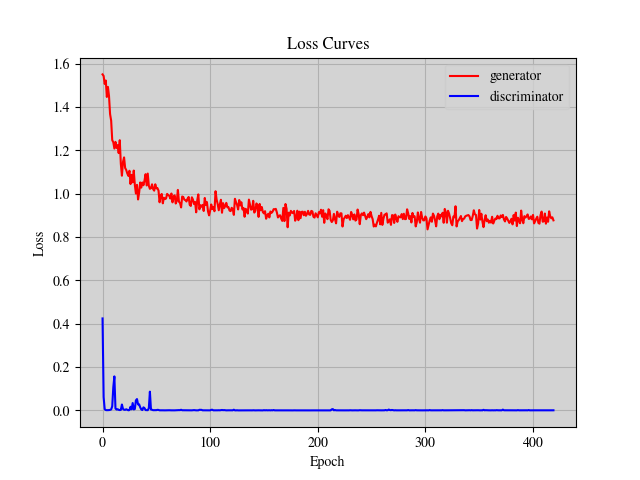

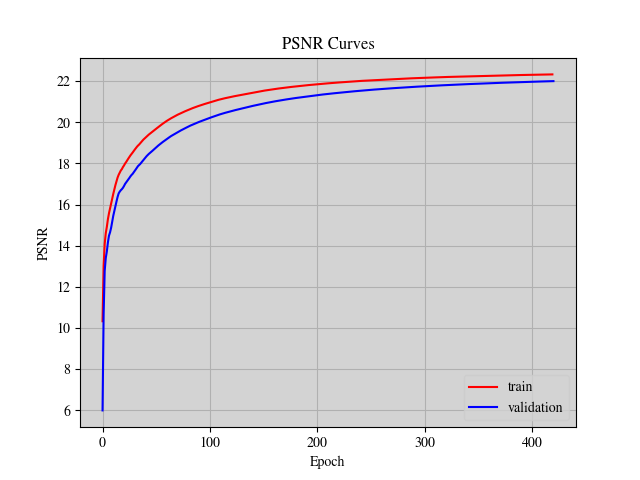

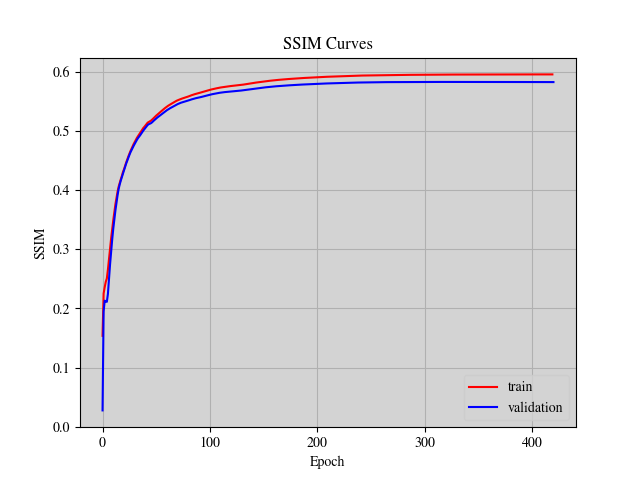

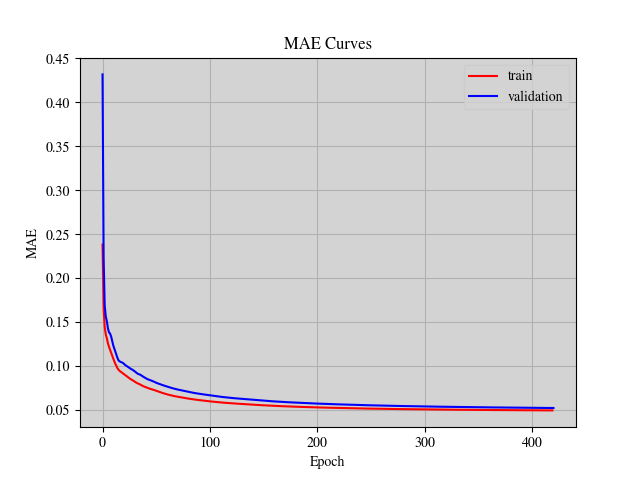

<Figure size 640x480 with 0 Axes>

In [ ]:
seed_everything(SEED, workers=True)

generator = Generator(channels=3, filters=N_FILTER, num_res_blocks=RESIDUAL_BLOCK)
discriminator = Discriminator(input_shape=(3, IMAGE_SIZE, IMAGE_SIZE))
content_extractor = ContentExtractor()
model = ModelWrapper(
    generator,
    discriminator,
    content_extractor,
    BATCH_SIZE,
    LR,
    MAX_EPOCH,
)

tensorboardlogger = TensorBoardLogger(save_dir="logs/")
csvlogger = CSVLogger(save_dir="logs/")
lr_monitor = LearningRateMonitor(logging_interval='step')
checkpoint = ModelCheckpoint(
    monitor='val_psnr',
    dirpath=CHECKPOINT_DIR,
    filename=f"{MODEL_NAME}_best",
    mode='max',
)
early_stopping = EarlyStopping(
    monitor="val_psnr",
    min_delta=0.00,
    patience=int(MAX_EPOCH * 0.1),
    verbose=False,
    mode="max",
)


trainer = Trainer(
    accelerator="auto",
    devices=1,
    max_epochs=MAX_EPOCH,
    logger=[tensorboardlogger, csvlogger],
    callbacks=[lr_monitor, checkpoint, early_stopping],
    log_every_n_steps=5,
)
trainer.fit(model)

## **Testing**

In [ ]:
trainer.test(ckpt_path='best')

INFO: Restoring states from the checkpoint path at /content/SRGAN_best.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restoring states from the checkpoint path at /content/SRGAN_best.ckpt
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: Loaded model weights from the checkpoint at /content/SRGAN_best.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Loaded model weights from the checkpoint at /content/SRGAN_best.ckpt


Testing: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_mae          │   0.048524875193834305    │
│         test_psnr         │    22.586994171142578     │
│         test_ssim         │    0.5862780213356018     │
└───────────────────────────┴───────────────────────────┘

[{'test_psnr': 22.586994171142578,
  'test_ssim': 0.5862780213356018,
  'test_mae': 0.048524875193834305}]

In [ ]:
os.rename(
    checkpoint.best_model_path,
    os.path.join(CHECKPOINT_DIR, f"{MODEL_NAME}_best.ckpt")
)

## **Inference**

In [ ]:
def plot_results(img, title):
    """Plot the result with zoom-in area."""
    img = img.astype("float32") / 255.0

    # Create a new figure with a default 111 subplot.
    fig, ax = plt.subplots()
    im = ax.imshow(img[::-1], origin="lower")

    plt.title(title)
    plt.axis("off")

    # zoom-factor: 2.0, location: upper-left
    axins = zoomed_inset_axes(ax, 2, loc=2)
    axins.imshow(img[::-1], origin="lower")

    # Specify the limits.
    x1, x2, y1, y2 = (
        int(img.shape[1] * 0.69),
        int(img.shape[1] * 0.840),
        int(img.shape[0] * 0.420),
        int(img.shape[0] * 0.69),
    )
    # Apply the x-limits.
    axins.set_xlim(x1, x2)
    # Apply the y-limits.
    axins.set_ylim(y1, y2)

    plt.yticks(visible=False)
    plt.xticks(visible=False)

    # Make the line.
    mark_inset(ax, axins, loc1=1, loc2=3, fc="none", ec="blue")

    plt.show()

In [ ]:
device = 'cpu' if not torch.cuda.is_available() else 'cuda'


def inference_transform(img):
    img = cv2.resize(
        img,
        (img.shape[1] // SCALE_FACTOR, img.shape[0] // SCALE_FACTOR),
        interpolation = cv2.INTER_AREA,
    )

    img = img.transpose(2,0,1).astype('float32')

    img /= 255.
    return torch.from_numpy(img).to(device)

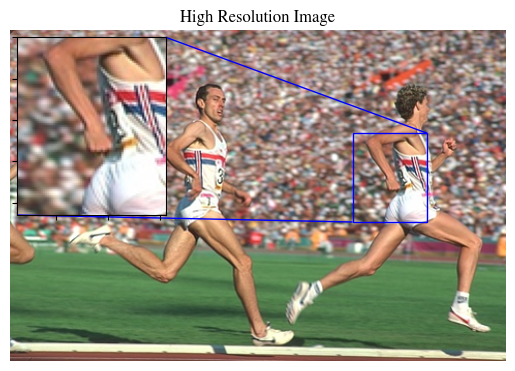

<Figure size 640x480 with 0 Axes>

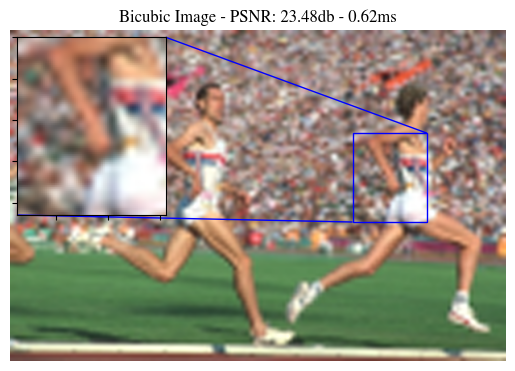

<Figure size 640x480 with 0 Axes>

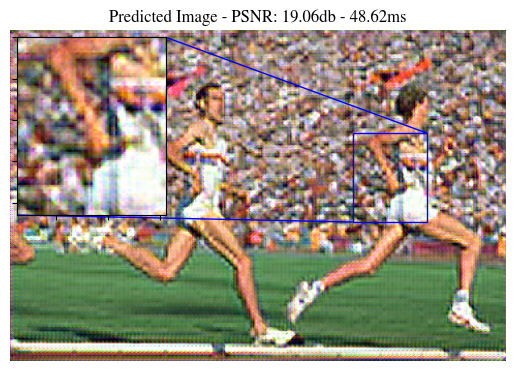

<Figure size 640x480 with 0 Axes>

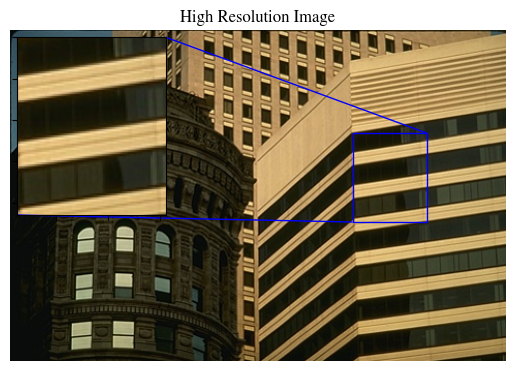

<Figure size 640x480 with 0 Axes>

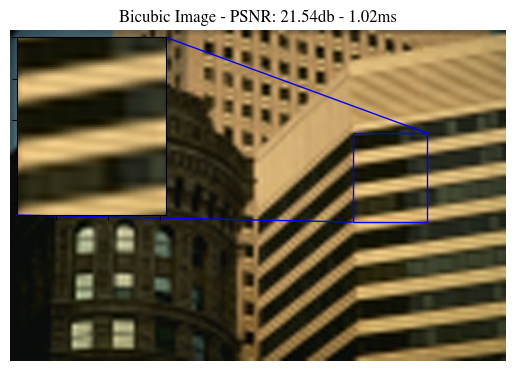

<Figure size 640x480 with 0 Axes>

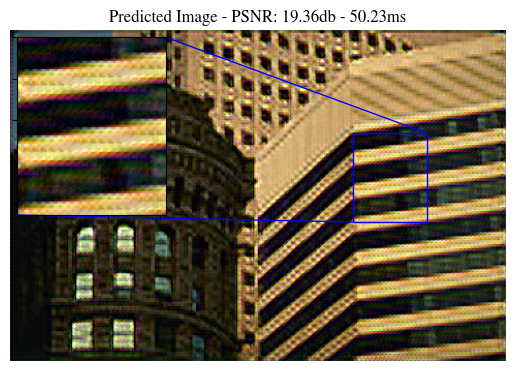

<Figure size 640x480 with 0 Axes>

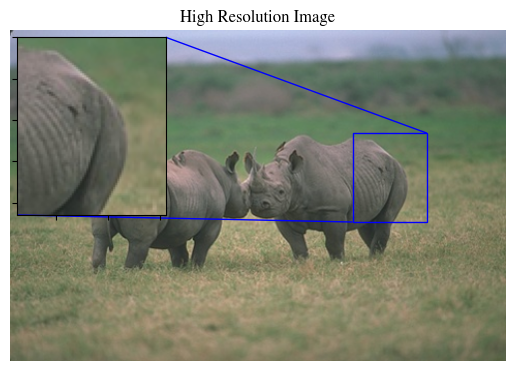

<Figure size 640x480 with 0 Axes>

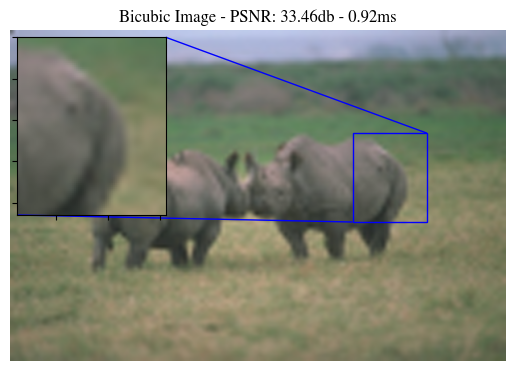

<Figure size 640x480 with 0 Axes>

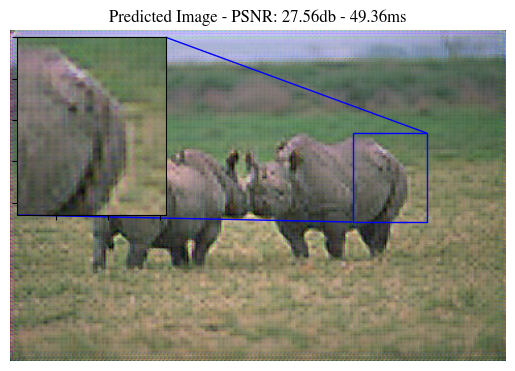

<Figure size 640x480 with 0 Axes>

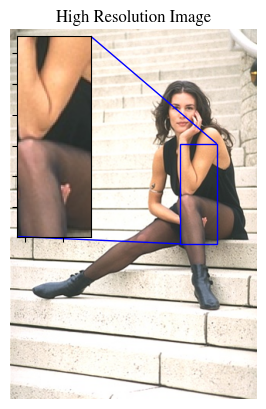

<Figure size 640x480 with 0 Axes>

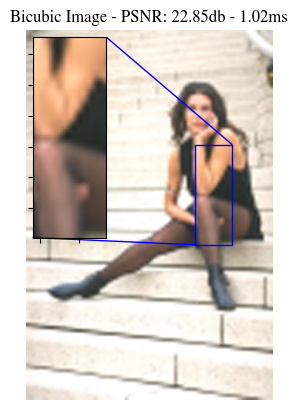

<Figure size 640x480 with 0 Axes>

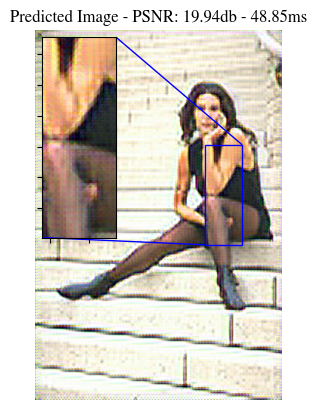

<Figure size 640x480 with 0 Axes>

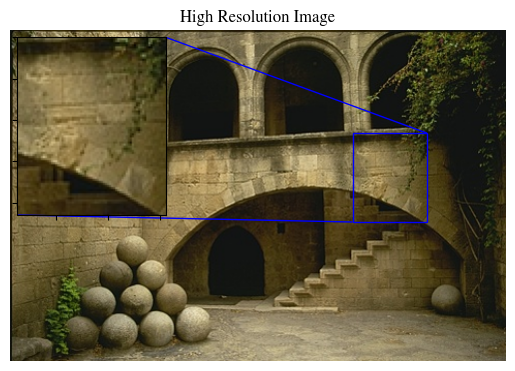

<Figure size 640x480 with 0 Axes>

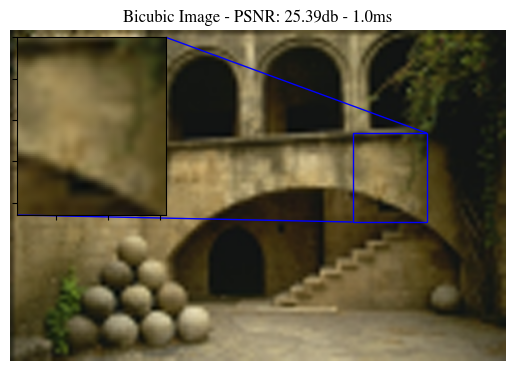

<Figure size 640x480 with 0 Axes>

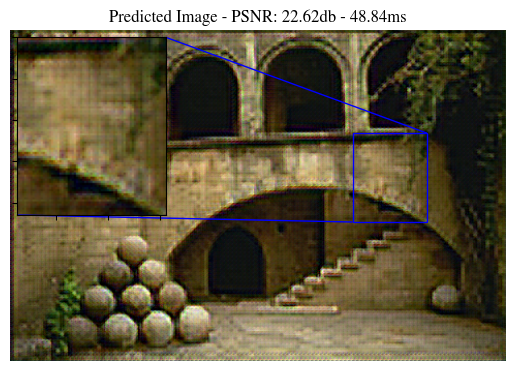

<Figure size 640x480 with 0 Axes>

In [ ]:
generator = Generator(channels=3, filters=N_FILTER, num_res_blocks=RESIDUAL_BLOCK)
discriminator = Discriminator(input_shape=(3, IMAGE_SIZE, IMAGE_SIZE))
content_extractor = ContentExtractor()
model = ModelWrapper.load_from_checkpoint(
    checkpoint_path=os.path.join(CHECKPOINT_DIR, f"{MODEL_NAME}_best.ckpt"),
    map_location=device,
    generator=generator,
    discriminator=discriminator,
    content_extractor=content_extractor,
    batch_size=BATCH_SIZE,
    lr=LR,
    max_epoch=MAX_EPOCH,
)
InferenceDataset = BSDS500Dataset(
    split="inference",
    low_res_transform=inference_transform,
)
N_SAMPLE = len(InferenceDataset._dataset)


for _ in range(5):
    sample_idx = random.randint(0, N_SAMPLE - 1)

    InferenceDataset.set_inference_index(sample_idx)
    inference_image = InferenceDataset.inference_image.copy()

    W = inference_image.shape[1] // SCALE_FACTOR
    H = inference_image.shape[0] // SCALE_FACTOR

    low_res_image = cv2.resize(
        inference_image,
        (W, H),
        interpolation = cv2.INTER_AREA,
    )

    high_res_image = cv2.resize(
        inference_image,
        (W * SCALE_FACTOR, H * SCALE_FACTOR),
        interpolation = cv2.INTER_CUBIC,
    )

    model.generator.eval()
    inference_tensor = inference_transform(inference_image).unsqueeze(0)
    start = time.time()
    prediction = model.generator(inference_tensor)
    prediction = torch.clamp(
        prediction - laplacian(prediction, 11),
        0.,
        1.,
    )
    prediction = (
        prediction.permute(0, 2, 3, 1)[0, ...].data.cpu().numpy() * 255.
    ).astype('uint8')
    end = time.time()
    pred_time = end - start

    low_res_image[:, :, (0, 1, 2)] = low_res_image[:, :, (2, 1, 0)]
    start = time.time()
    low_res_image = cv2.resize(
        low_res_image,
        (W * SCALE_FACTOR, H * SCALE_FACTOR),
        interpolation = cv2.INTER_CUBIC,
    )
    end = time.time()
    bicubic_time = end - start
    high_res_image[:, :, (0, 1, 2)] = high_res_image[:, :, (2, 1, 0)]
    prediction[:, :, (0, 1, 2)] = prediction[:, :, (2, 1, 0)]

    y = torch.from_numpy(high_res_image.transpose(2,0,1).astype('float32') / 255.).to(device)
    plot_results(high_res_image, "High Resolution Image")
    plt.clf()

    y_hat = torch.from_numpy(low_res_image.transpose(2,0,1).astype('float32') / 255.).to(device)
    psnr = PeakSignalNoiseRatio(data_range=1.0).to(device)
    psnr.update(y_hat, y)
    psnr = psnr.compute().data.cpu().item()
    plot_results(
        low_res_image,
        f"Bicubic Image - PSNR: {round(psnr, 2)}db - {round(bicubic_time * 1000, 2)}ms",
    )
    plt.clf()

    y_hat = torch.from_numpy(prediction.transpose(2,0,1).astype('float32') / 255.).to(device)
    psnr = PeakSignalNoiseRatio(data_range=1.0).to(device)
    psnr.update(y_hat, y)
    psnr = psnr.compute().data.cpu().item()
    plot_results(
        prediction,
        f"Predicted Image - PSNR: {round(psnr, 2)}db - {round(pred_time * 1000, 2)}ms",
    )
    plt.clf()